<a href="https://colab.research.google.com/github/SalgadoHUB/Classical_Mechanics_II/blob/main/Tarea_1_SymPy_CR3BP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lagrangiano de una Partícula en un Sistema en Rotación

## Introducción

Consideremos una partícula de masa $ m $ que se mueve en un sistema de referencia en rotación con velocidad angular $\mathbf{w}$. Nuestro objetivo es determinar su Lagrangiano en dicho sistema.

## Energía Cinética en un Sistema en Rotación

La velocidad de la partícula en el sistema inercial está dada por:

\begin{equation}
\mathbf{v}_{\text{inercial}} = \mathbf{\dot{r}} + \mathbf{w} \times \mathbf{r}.
\end{equation}

Por lo tanto, la energía cinética de la partícula en el sistema inercial es:

\begin{equation}
T = \frac{1}{2} m \|\mathbf{v}_{\text{inercial}}\|^2.
\end{equation}

Sustituyendo la expresión de $ \mathbf{v}_{\text{inercial}}$:

\begin{equation}
T = \frac{1}{2} m \left( \|\mathbf{\dot{r}}\|^2 + 2 (\mathbf{w} \times \mathbf{r}) \cdot \mathbf{\dot{r}} + \|\mathbf{w} \times \mathbf{r}\|^2 \right).
\end{equation}






In [ ]:
import sympy as sp
from sympy.physics.vector import dynamicsymbols


# Definir las variables simbólicas
x, y, z = dynamicsymbols('x y z') # coordenadas de la partícula desde CDM
m, t = sp.symbols('m t')  # Masa de la partícula, tiempo
w = sp.symbols('w')  # Velocidad angular del sistema de referencia en rotación


r = sp.sqrt(x**2 + y**2 + z**2)  # Distancia de la partícula al CDM
xdot, ydot, zdot = sp.diff(x, t), sp.diff(y, t), sp.diff(z, t)  # Velocidades
xddot, yddot, zddot = sp.diff(xdot, t), sp.diff(ydot, t), sp.diff(zdot, t)  # Aceleraciones

#rdot = sp.diff(r, t) # velocidad
rdot = sp.Matrix([xdot, ydot, zdot]) # velocidad

wx, wy, wz = sp.symbols('wx wy wz')  # Componentes de la velocidad angular del sistema de referencia
rx, ry, rz = sp.symbols('rx ry rz', cls=sp.Function)  # Posición de la partícula respeco CDM
vx, vy, vz = sp.symbols('vx vy vz')  # Componentes de la velocidad en el sistema en rotación

# Vectores
#w = sp.Matrix([0, 0, wz])  # Velocidad angular del Sistema de Referencia
r = sp.Matrix([rx(t), ry(t), 0])  # Posición respecto CDM
#v_rot = sp.Matrix([vx, vy, 0])  # Velocidad en el sistema rotante
rdot = sp.diff(r, t) # velocidad

# Calcular el término de velocidad de arrastre w x r
#w_cross_r = w.cross(r)

# Velocidad en el sistema inercial
#v_inercial = v_rot + w_cross_r
#v_inercial = rdot + w_cross_r

#v_inercial.simplify()

# Energía cinética (T)
#T = (1/2) * m * (rdot.dot(rdot) + 2*w_cross_r.dot(rdot) + w_cross_r.dot(w_cross_r))
#T = (1/2) * m * v_inercial.dot(v_inercial)
T = (1/2) * m * (xdot**2 + ydot**2 + zdot**2) + m * w * (x*ydot - y*xdot) + (1/2) * m * w**2 * (x**2 + y**2 + z**2)

# Mostrar T
T.simplify()
T

0.5*m*w**2*(x(t)**2 + y(t)**2 + z(t)**2) + m*w*(x(t)*Derivative(y(t), t) - y(t)*Derivative(x(t), t)) + 0.5*m*(Derivative(x(t), t)**2 + Derivative(y(t), t)**2 + Derivative(z(t), t)**2)

## Energía Potencial

La expresión de la energía potencial gravitatoria creada por las masas $M_1$ y $M_2$ en una partícula de masa $m$ situada a una distancia $r$ del centro de masas es:

\begin{equation}
V = - G \left( \frac{M_1 m}{|a_1 + r|} + \frac{M_2 m}{|a_2 - r|} \right).
\end{equation}

Esta ecuación muestra que la energía potencial es la suma de las contribuciones de cada masa, considerando sus distancias absolutas al punto donde se encuentra la partícula.


In [ ]:
# Energia potencial
M1, M2 = sp.symbols('M1 M2')  # Masas de los planetas de la partícula
G = sp.symbols('G') # constante gravitatoria
a, a1, a2 = sp.symbols('a a1 a2') # Distancias a m desde CDM, M1 y M2

V1 = -G * M1 * m / sp.sqrt((x + a1)**2 + y**2 + z**2)
V2 = -G * M2 * m / sp.sqrt((x - a2)**2 + y**2 + z**2)

V = V1 + V2
V.simplify()
V

-G*M1*m/sqrt((a1 + x(t))**2 + y(t)**2 + z(t)**2) - G*M2*m/sqrt((-a2 + x(t))**2 + y(t)**2 + z(t)**2)

## Lagrangiano

El Lagrangiano se define como:

\begin{equation}
L = T - V.
\end{equation}

Sustituyendo las expresiones anteriores:

\begin{equation}
L = \frac{1}{2} m \|\mathbf{\dot{r}}\|^2 + m (\mathbf{w} \times \mathbf{r}) \cdot \mathbf{\dot{r}} + \frac{1}{2} m \|\mathbf{w} \times \mathbf{r}\|^2 - V(\mathbf{r}).
\end{equation}

Podemos identificar cada término en el Lagrangiano de la siguiente manera:

- $\frac{1}{2} m \|\mathbf{\dot{r}}\|^2$: representa la energía cinética en el sistema en rotación.
- $ m (\mathbf{w} \times \mathbf{r}) \cdot \mathbf{\dot{r}} $: es el término de Coriolis.
- $\frac{1}{2} m \|\mathbf{w} \times \mathbf{r}\|^2 $: es el término centrífugo.
- $-V(\mathbf{r}) $: es la energía potencial externa.

In [ ]:
# Lagrangiano

L = T - V
L

G*M1*m/sqrt((a1 + x(t))**2 + y(t)**2 + z(t)**2) + G*M2*m/sqrt((-a2 + x(t))**2 + y(t)**2 + z(t)**2) + 0.5*m*w**2*(x(t)**2 + y(t)**2 + z(t)**2) + m*w*(x(t)*Derivative(y(t), t) - y(t)*Derivative(x(t), t)) + 0.5*m*(Derivative(x(t), t)**2 + Derivative(y(t), t)**2 + Derivative(z(t), t)**2)

# Gráfica de $V_{eff}$

Primero identificamos en $L$ los términos que no dependen de $\dot{r}$. Nos restingimos también al plano $z=0$ para hacer la gráfica.


In [ ]:
V_eff = -L.subs([(xdot, 0), (ydot, 0), (zdot, 0)])
#V_eff = V_eff.subs([(z, 0)])
V_eff

-G*M1*m/sqrt((a1 + x(t))**2 + y(t)**2 + z(t)**2) - G*M2*m/sqrt((-a2 + x(t))**2 + y(t)**2 + z(t)**2) - 0.5*m*w**2*(x(t)**2 + y(t)**2 + z(t)**2)

De la misma manera, podríamos encontrar una $T_{eff}$ tomando el resto de términos de $L$ que hemos eliminado antes.


In [ ]:
T_eff = L - L.subs([(xdot, 0), (ydot, 0), (zdot, 0)])
T_eff


m*w*(x(t)*Derivative(y(t), t) - y(t)*Derivative(x(t), t)) + 0.5*m*(Derivative(x(t), t)**2 + Derivative(y(t), t)**2 + Derivative(z(t), t)**2)

## Gráfica 1D
Nos limitamos al eje que une las partículas $M_1$ y $M_2$. Para ello, forzamos $y=z=0$.

In [ ]:
V_eff = V_eff.subs([(y, 0), (z, 0)])
V_eff

-G*M1*m/sqrt((a1 + x(t))**2) - G*M2*m/sqrt((-a2 + x(t))**2) - 0.5*m*w**2*x(t)**2

Para tener una expresión más compacta, introducimos los parámetros de un sistema binario en órbita circular:

- $\mu=M1/M2$
- $a_1=\mu a$, $a_2=(1-\mu)a$
- $r_1=x+a_1$, $r2=x-a_2$
- $GM_1=w^2 a^2 a_1$, $GM_2=w^2 a^2 a_2$

In [ ]:
V_eff = -L.subs([(xdot, 0), (ydot, 0), (zdot, 0)])
V_eff = V_eff.subs([(y, 0), (z, 0)])

mu, r1, r2 = sp.symbols('mu r1 r2')  # Masa de la partícula, tiempo
V_eff = V_eff.subs([(x+a1,r1), (x-a2,r2)])
V_eff = V_eff.subs([(G*M1, w**2*a**2*a2), (G*M2, w**2*a**2*a1)])
V_eff = V_eff.subs([(a1,mu*a), (a2,(1-mu)*a)])
V_eff

-a**3*m*mu*w**2/sqrt(r2**2) - a**3*m*w**2*(1 - mu)/sqrt(r1**2) - 0.5*m*w**2*x(t)**2

Para hacer la gráfica, recurrimos a Numpy y Matplotlib. Por simplificar, tomamos $a=\omega=1$, y a modo de ejemplo elegimos $\mu=0.1$ (parecido al valor en el sitema Tierra-Luna).

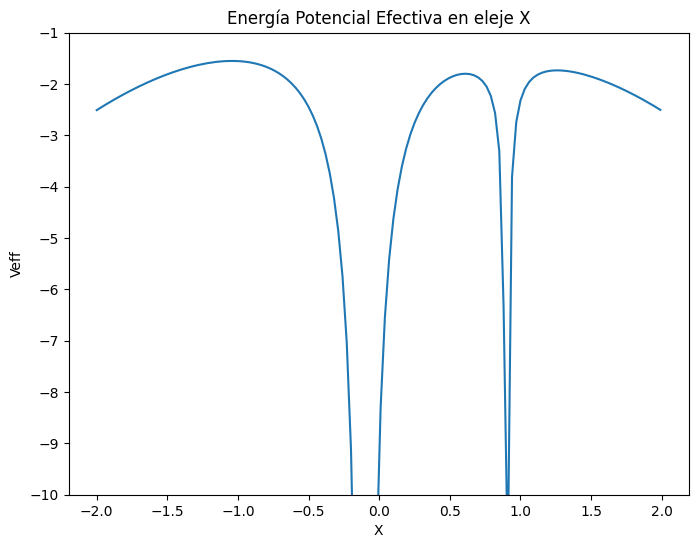

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm


# Parámetro del problema (mu: masa reducida del cuerpo secundario, omega: velocidad angular)
mu = 0.1  # Puedes cambiar este valor
omega = 1  # Velocidad angular estándar en CR3BP

# Crear una malla de valores para X e Y
r_max = 2
dr  = 0.03
X = np.arange(-r_max, r_max, dr)

# Definir las distancias a los cuerpos primarios
r1 = np.sqrt((X + mu)**2)  # Distancia al cuerpo principal (de masa 1 - mu)
r2 = np.sqrt((X - 1 + mu)**2)  # Distancia al cuerpo secundario (de masa mu)

# Calcular la energía potencial efectiva
V_eff = - (1 - mu) / r1 - mu / r2 - (1/2) * omega**2 * (X**2)

# Crear la figura y el eje 3D
fig, ax = plt.subplots(figsize=(8, 6))

# Graficar la función V_eff
ax.plot(X,V_eff)
ax.set_ylim([-10, -1])
# Etiquetas de los ejes
ax.set_xlabel('X')
ax.set_ylabel('Veff')
ax.set_title('Energía Potencial Efectiva en eleje X')

# Mostrar la gráfica
plt.show()

A la vista de esta gráfica, además de los dos pozos de potencial en las posiciones de $M_1$ y $M_2$, exixten otros tres puntos de equilibrio, y los tres son inestables.

## Gráfica 2D
Graficamos ahora $V_{eff}$ en un plano.
Nos restringimos al plano $XY$, así que forzamos $z=0$.

In [ ]:
V_eff = -L.subs([(xdot, 0), (ydot, 0), (zdot, 0)])
V_eff = V_eff.subs([(z, 0)])
V_eff

-G*M1*m/sqrt((a1 + x(t))**2 + y(t)**2) - G*M2*m/sqrt((-a2 + x(t))**2 + y(t)**2) - 0.5*m*w**2*(x(t)**2 + y(t)**2)

Para hacer la gráfica, recurrimos a Numpy y Matplotlib.

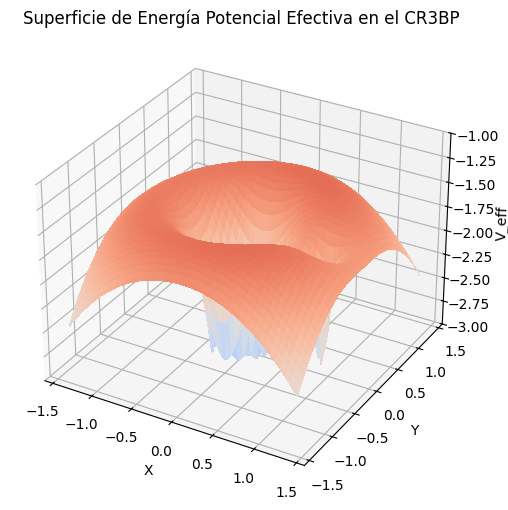

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm


# Parámetro del problema (mu: masa reducida del cuerpo secundario, omega: velocidad angular)
mu = 0.1  # Puedes cambiar este valor
omega = 1  # Velocidad angular estándar en CR3BP

# Crear una malla de valores para X e Y
r_max = 1.4
dr  = 0.03
x_num = np.arange(-r_max, r_max, dr)
y_num = np.arange(-r_max, r_max, dr)
X, Y = np.meshgrid(x_num, y_num)

# Definir las distancias a los cuerpos primarios
r1 = np.sqrt((X + mu)**2 + Y**2)  # Distancia al cuerpo principal (de masa 1 - mu)
r2 = np.sqrt((X - 1 + mu)**2 + Y**2)  # Distancia al cuerpo secundario (de masa mu)

# Calcular la energía potencial efectiva
V_eff = - (1 - mu) / r1 - mu / r2 - (1/2) * omega**2 * (X**2 + Y**2)
threshold = -3 # límite para mejorar la representación visual
V_mask = np.ma.masked_array(V_eff, V_eff <= threshold) # Dibujamos solo los valores mayores que threshold

# Crear la figura y el eje 3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Graficar la superficie de V_eff
ax.plot_surface(X, Y, V_mask, cmap=cm.coolwarm, linewidth=0, antialiased=False, vmin = -4, vmax = -1)

# Etiquetas de los ejes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('V_eff')
ax.set_title('Superficie de Energía Potencial Efectiva en el CR3BP')

ax.set_zlim(threshold, -1)

# Mostrar la gráfica
plt.show()


Para verlo mejor, vamos a combinar en un gráfico el valor del potencial (escala de color) con las líneas de nivel del potencial efectivo.

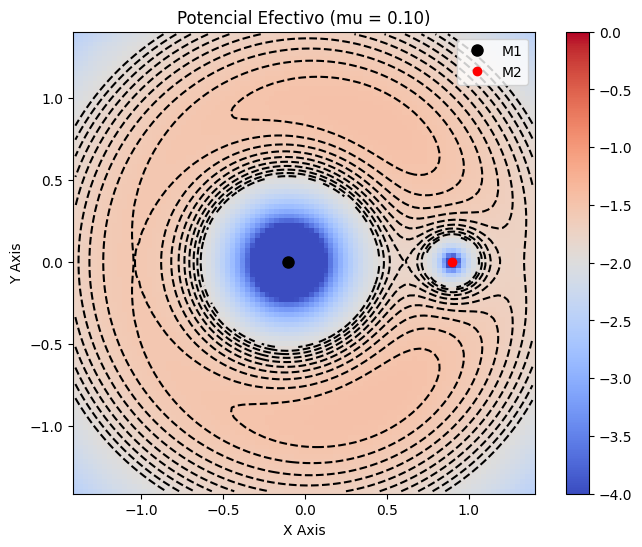

In [ ]:
threshold = -2 # límite para mejorar la representación visual
V_mask = np.ma.masked_array(V_eff, V_eff <= threshold) # Dibujamos solo los valores mayores que threshold

fig, ax = plt.subplots(figsize=(8, 6))
pcolor = ax.pcolormesh(x_num, y_num, V_eff, vmin = -4, vmax = -0)
pcolor.set_cmap('coolwarm')
CS = ax.contour(x_num, y_num, V_mask, 10, colors='k')

# Dibujar las posiciones de los cuerpos primarios
ax.plot(-mu, 0, 'ko', markersize=8, label='M1')
ax.plot(1 - mu, 0, 'ro', markersize=6, label='M2')

ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_aspect('equal', 'box')
#ax.set_zlabel("V")
ax.set_title(f'Potencial Efectivo (mu = {mu:.2f})')
ax.legend()
fig.colorbar(pcolor, ax=ax)

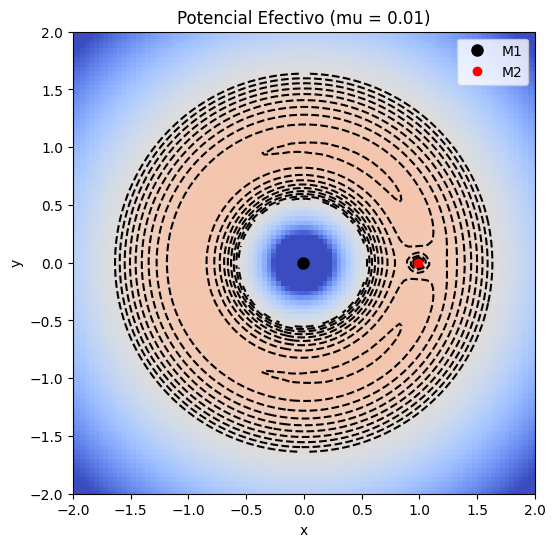

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Definir el rango del espacio
r_max = 2
x_num = np.linspace(-r_max, r_max, 100)
y_num = np.linspace(-r_max, r_max, 100)
X, Y = np.meshgrid(x_num, y_num)

# Función del potencial efectivo con a=w=1
def potential_effective(X, Y, mu):
    r1 = np.sqrt((X + mu)**2 + Y**2)
    r2 = np.sqrt((X - (1 - mu))**2 + Y**2)
    return - (1 - mu) / r1 - mu / r2 - 0.5 * (X**2 + Y**2)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(6, 6))
cbar = None

# Función de actualización para la animación
def update(mu):
    global cbar
    ax.clear()
    V_eff = potential_effective(X, Y, mu)
    threshold = -2 # límite para mejorar la representación visual
    V_mask = np.ma.masked_array(V_eff, V_eff <= threshold) # Dibujamos solo los valores mayores que threshold

    pcolor = ax.pcolormesh(x_num, y_num, V_eff, vmin = -4, vmax = -0)
    pcolor.set_cmap('coolwarm')
    CS = ax.contour(x_num, y_num, V_mask, 10, colors='k')

    # Dibujar las posiciones de los cuerpos primarios
    ax.plot(-mu, 0, 'ko', markersize=8, label='M1')
    ax.plot(1 - mu, 0, 'ro', markersize=6, label='M2')

    ax.set_title(f'Potencial Efectivo (mu = {mu:.2f})')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_xlim(-r_max, r_max)
    ax.set_ylim(-r_max, r_max)
    ax.set_aspect('equal', 'box')
    ax.legend()

# Crear la animación
mu_values = np.linspace(0.01, 0.99, 50)
ani = animation.FuncAnimation(fig, update, frames=mu_values, interval=100)

# Mostrar la animación
from IPython.display import HTML
HTML(ani.to_jshtml())

# Guardar la animación
#video_filename = "animacion.mp4"
#ani.save(video_filename, writer="ffmpeg", fps=12)
